# Business case:-With the healthy lifestyle city datset we need to cluster healthy lifestyle city into certain group.

In [1]:
#calling libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#### Load the data

In [2]:
data=pd.read_csv("healthy_lifestyle_city_2021.csv",na_values=['-'])

In [3]:
data.head()

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,Amsterdam,1,1858.0,£1.92,20.40%,81.2,30.93,1434.0,7.44,422,1048,£34.90
1,Sydney,2,2636.0,£1.48,29.00%,82.1,26.86,1712.0,7.22,406,1103,£41.66
2,Vienna,3,1884.0,£1.94,20.10%,81.0,17.33,1501.0,7.29,132,1008,£25.74
3,Stockholm,4,1821.0,£1.72,20.60%,81.8,19.63,1452.0,7.35,129,598,£37.31
4,Copenhagen,5,1630.0,£2.19,19.70%,79.8,21.24,1380.0,7.64,154,523,£32.53


# Domain Analysis

##### Dataset introduction:- healthy lifestyle cities in 2021 with different features
* City:- total 44 healthy life-style city in 2021.

* Rank:- rank of healty life-style city.

* Sunshine hours(City):- Sunshine hours is a measure of the amount of direct sunshine a site receives(per year)

* Cost of a bottle of water(City):- cost of water bottel in pound.

* Obesity levels(Country):-A condition characterised by abnormal or excessive fat accumulation.

* Life expectancy(years) (Country):- Life expentancy of healthy lifestyle city.

* Pollution:- the Comprehensive Environmental Pollution Index (CEPI) scores of the critically polluted industrial clusters/areas. The index captures the various dimensions of environment including air, water and land.

* Annual avg. hours worked :- working hours (avg 1,730 hours per year, or 36.04 hours per week).

* Happiness levels(Country) :-It is based on national happiness as well as based on respondent ratings of their own lives, which the report also correlates with various (quality of) life factors.

* Outdoor activities(City):-activity that occurs in an unroofed area as part of a permitted use on a lot and any outdoor display of material & Outdoor activity means an athletic, entertainment or similar activity.(count of outdoor activities in per year).

* Number of take out places(City):- Total take-out places in city.

* Cost of a monthly gym membership(City):- Monthly cost of gym in pound.

#### Basic Checks

In [4]:
# for first five rows
data.head()

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,Amsterdam,1,1858.0,£1.92,20.40%,81.2,30.93,1434.0,7.44,422,1048,£34.90
1,Sydney,2,2636.0,£1.48,29.00%,82.1,26.86,1712.0,7.22,406,1103,£41.66
2,Vienna,3,1884.0,£1.94,20.10%,81.0,17.33,1501.0,7.29,132,1008,£25.74
3,Stockholm,4,1821.0,£1.72,20.60%,81.8,19.63,1452.0,7.35,129,598,£37.31
4,Copenhagen,5,1630.0,£2.19,19.70%,79.8,21.24,1380.0,7.64,154,523,£32.53


In [5]:
# Last five rows
data.tail()

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
39,Milan,40,1915.0,£1.15,19.90%,82.7,67.19,1718.0,6.38,110,2396,£53.49
40,"Washington, D.C.",41,2528.0,£1.45,36.20%,78.8,39.18,1779.0,6.94,83,744,£65.99
41,New York,42,2535.0,£1.32,36.20%,78.8,57.36,1779.0,6.94,359,3081,£64.66
42,Moscow,43,1901.0,£0.41,23.10%,69.5,57.63,1965.0,5.54,322,3206,£31.40
43,Mexico City,44,2555.0,£0.45,28.90%,76.4,82.78,2137.0,6.46,192,1313,£41.99


In [6]:
data.columns

Index(['City', 'Rank', 'Sunshine hours(City)',
       'Cost of a bottle of water(City)', 'Obesity levels(Country)',
       'Life expectancy(years) (Country)', 'Pollution(Index score) (City)',
       'Annual avg. hours worked', 'Happiness levels(Country)',
       'Outdoor activities(City)', 'Number of take out places(City)',
       'Cost of a monthly gym membership(City)'],
      dtype='object')

* Total 12 columns in dataset.

In [7]:
data.shape

(44, 12)

* Total 44 observations with 12 features.

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 12 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   City                                    44 non-null     object 
 1   Rank                                    44 non-null     int64  
 2   Sunshine hours(City)                    43 non-null     float64
 3   Cost of a bottle of water(City)         44 non-null     object 
 4   Obesity levels(Country)                 44 non-null     object 
 5   Life expectancy(years) (Country)        44 non-null     float64
 6   Pollution(Index score) (City)           43 non-null     float64
 7   Annual avg. hours worked                33 non-null     float64
 8   Happiness levels(Country)               44 non-null     float64
 9   Outdoor activities(City)                44 non-null     int64  
 10  Number of take out places(City)         44 non-null     int64  


In [9]:
# Examine the data
data.describe()

,Rank,Sunshine hours(City),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City)
count,44.000000,43.000000,44.00000,43.000000,33.000000,44.000000,44.000000,44.000000
mean,22.500000,2245.860465,78.17500,51.122326,1672.909091,6.435000,213.977273,1443.113636
std,12.845233,567.403719,5.30437,21.856190,179.626933,0.991202,127.190297,1388.803270
min,1.000000,1405.000000,56.30000,13.080000,1380.000000,3.570000,23.000000,250.000000
25%,11.750000,1798.500000,75.40000,34.355000,1540.000000,5.870000,125.250000,548.000000
50%,22.500000,2066.000000,80.40000,52.640000,1686.000000,6.900000,189.500000,998.000000
75%,33.250000,2629.000000,81.80000,66.630000,1779.000000,7.175000,288.250000,1674.250000
max,44.000000,3542.000000,83.20000,91.740000,2137.000000,7.800000,585.000000,6417.000000


* constant column is not present in datset.

In [10]:
# Remove special characters
data=data.replace('[\£,%]','',regex=True)
data.head()

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,Amsterdam,1,1858.0,1.92,20.40,81.2,30.93,1434.0,7.44,422,1048,34.90
1,Sydney,2,2636.0,1.48,29.00,82.1,26.86,1712.0,7.22,406,1103,41.66
2,Vienna,3,1884.0,1.94,20.10,81.0,17.33,1501.0,7.29,132,1008,25.74
3,Stockholm,4,1821.0,1.72,20.60,81.8,19.63,1452.0,7.35,129,598,37.31
4,Copenhagen,5,1630.0,2.19,19.70,79.8,21.24,1380.0,7.64,154,523,32.53


# Exploratory Data Analysis

#### 1.Univariate Analysis

In [11]:
import sweetviz as sv
univariate_report=sv.analyze(data)
univariate_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Observation

* Rank:- healthy life-style city rank range between 1 to 44.
* Sunshie-city:- the maximun sunshine hours is 3542 and lowest sunshine hours is 1405.
* Life expentancy:- the average life expentancy of healty life-style city is 78.2 year.
* pollution index score :- the range of pollution index score between 13.1 to 91.7.
* happiness level:- average of happiness level of healthy life-style city is 6.44.
* outdoor activities :- maximum 585 & minimum 23 outdoor activities in healty life-style city.
* No of take out places:- the take out places range between 250 to 6417.

#### 2. Bivariate Analysis

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
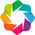

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (44, 12)
#######################################################################################
######################## C L A S S I 

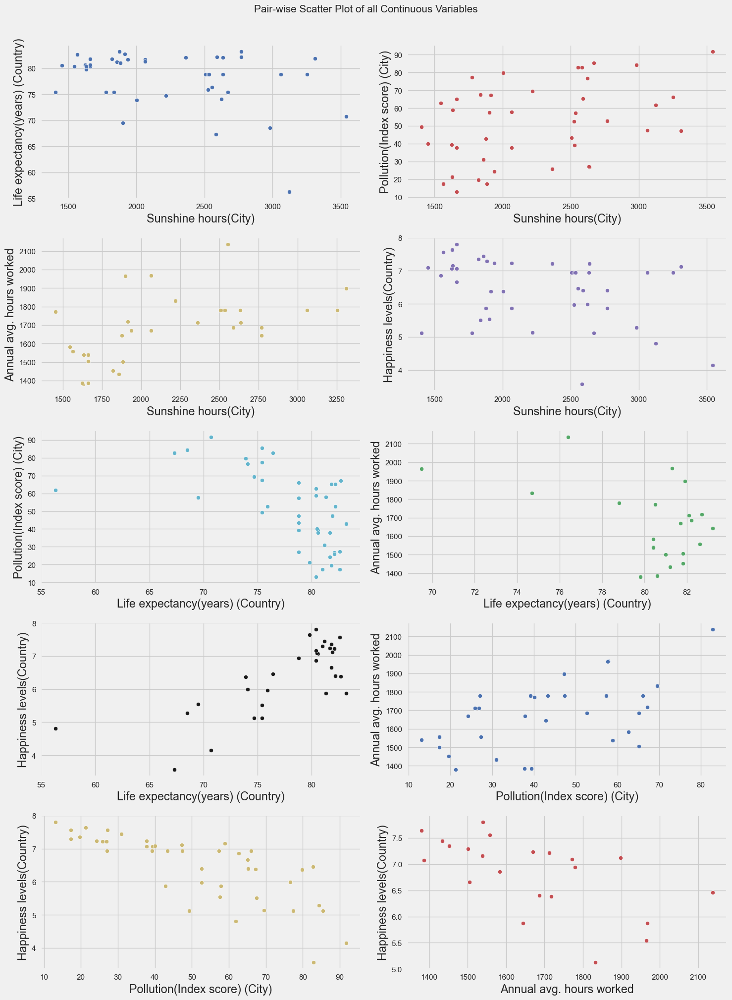

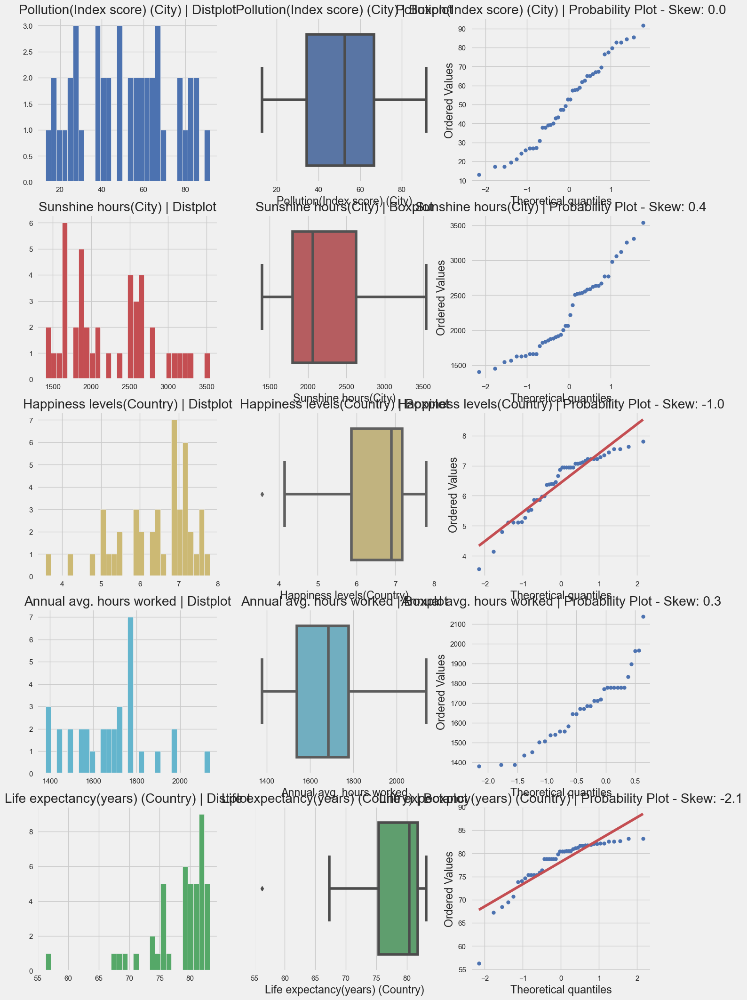

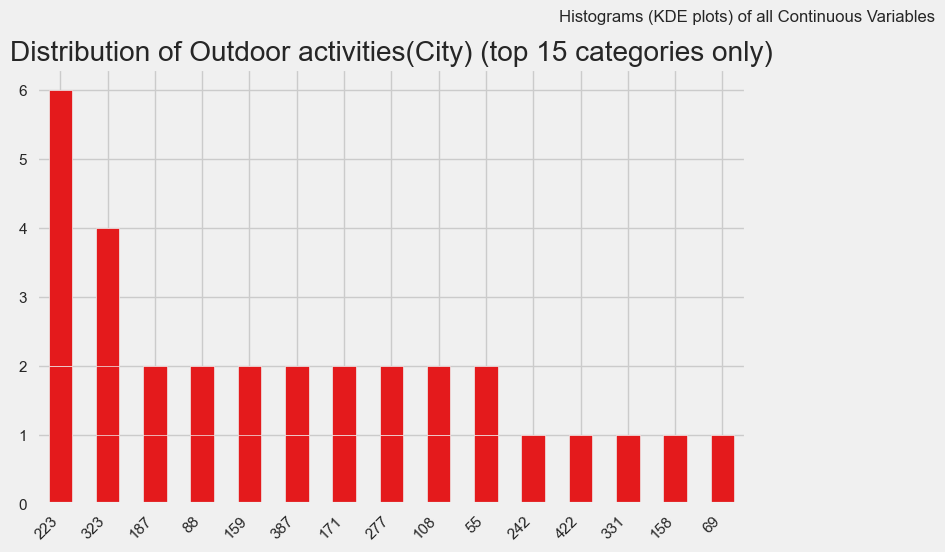

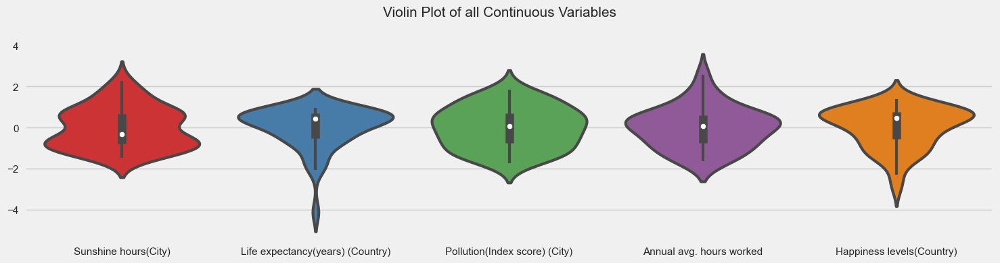

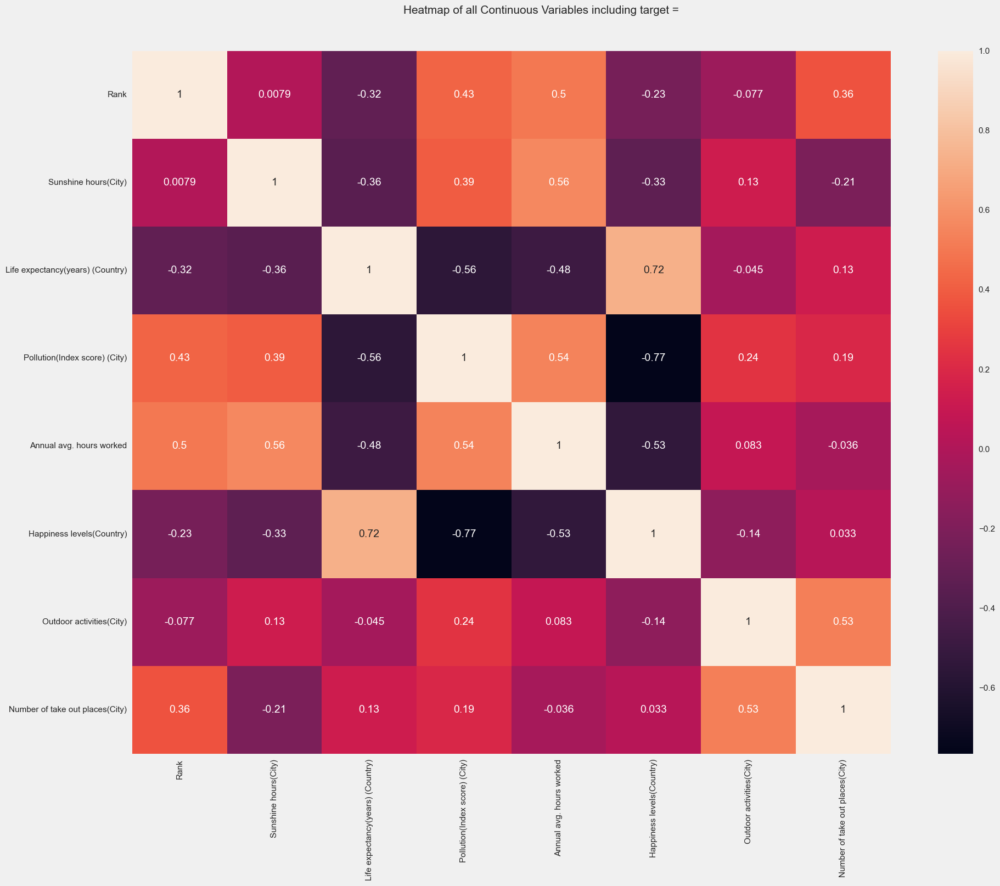

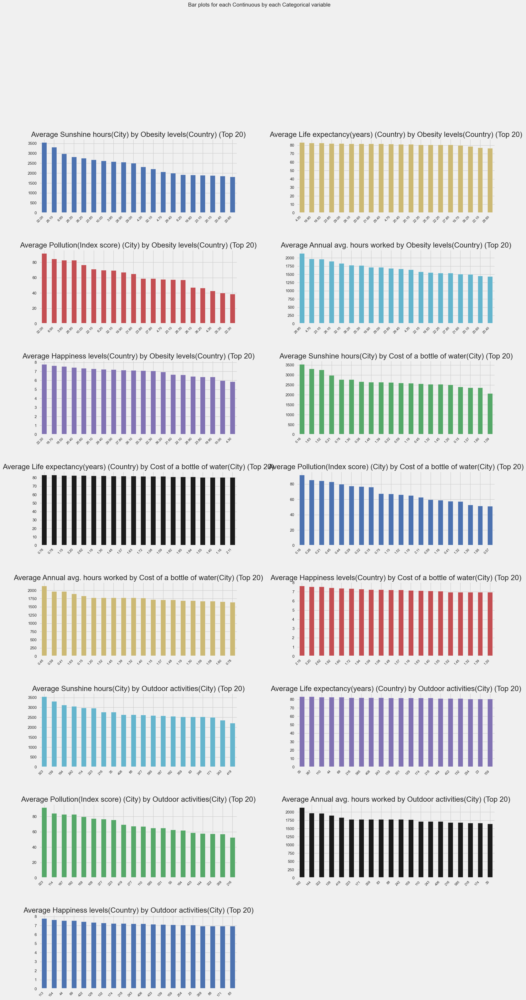

All Plots done
Time to run AutoViz = 20 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [12]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
av=AutoViz_Class()
filename=""
sep=","
dft = av.AutoViz(
      filename,
      sep=",",
      depVar="",
      dfte=data,
      header=0,
      verbose=0,
      lowess=False,
      max_rows_analyzed=150000,
      max_cols_analyzed=30,
      # Save_plot_dir=None,
       save_plot_dir=None
)

#### 3. Multivariate Analysis

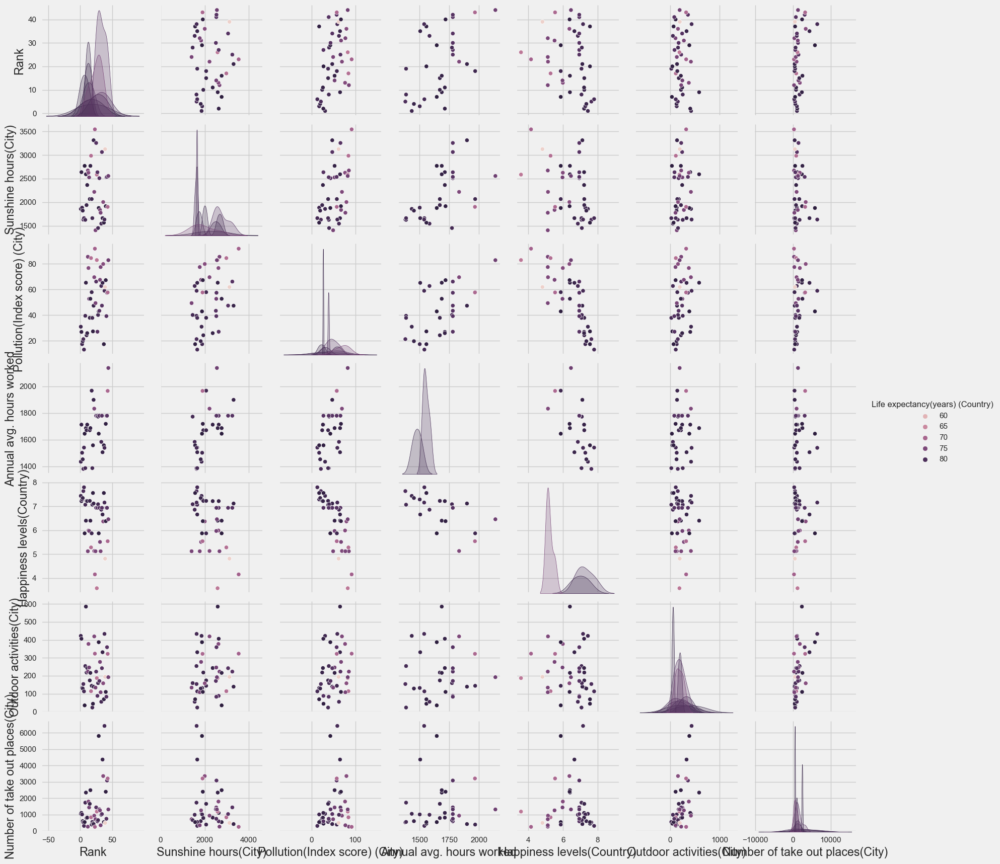

In [13]:
sns.pairplot(data,hue='Life expectancy(years) (Country)',data=data)
plt.show()

# Data preprocessing and feature engineering

In [14]:
#step1:-check missing values
data.isnull().sum()

City                                       0
Rank                                       0
Sunshine hours(City)                       1
Cost of a bottle of water(City)            0
Obesity levels(Country)                    0
Life expectancy(years) (Country)           0
Pollution(Index score) (City)              1
Annual avg. hours worked                  11
Happiness levels(Country)                  0
Outdoor activities(City)                   0
Number of take out places(City)            0
Cost of a monthly gym membership(City)     0
dtype: int64

* missing values present in Sunshine hours(City),Pollution(Index score) (City),Annual avg. hours worked .

In [15]:
data1=data[['Sunshine hours(City)','Cost of a bottle of water(City)','Obesity levels(Country)',
              'Life expectancy(years) (Country)','Pollution(Index score) (City)',
              'Happiness levels(Country)','Outdoor activities(City)','Number of take out places(City)',
              'Cost of a monthly gym membership(City)']]

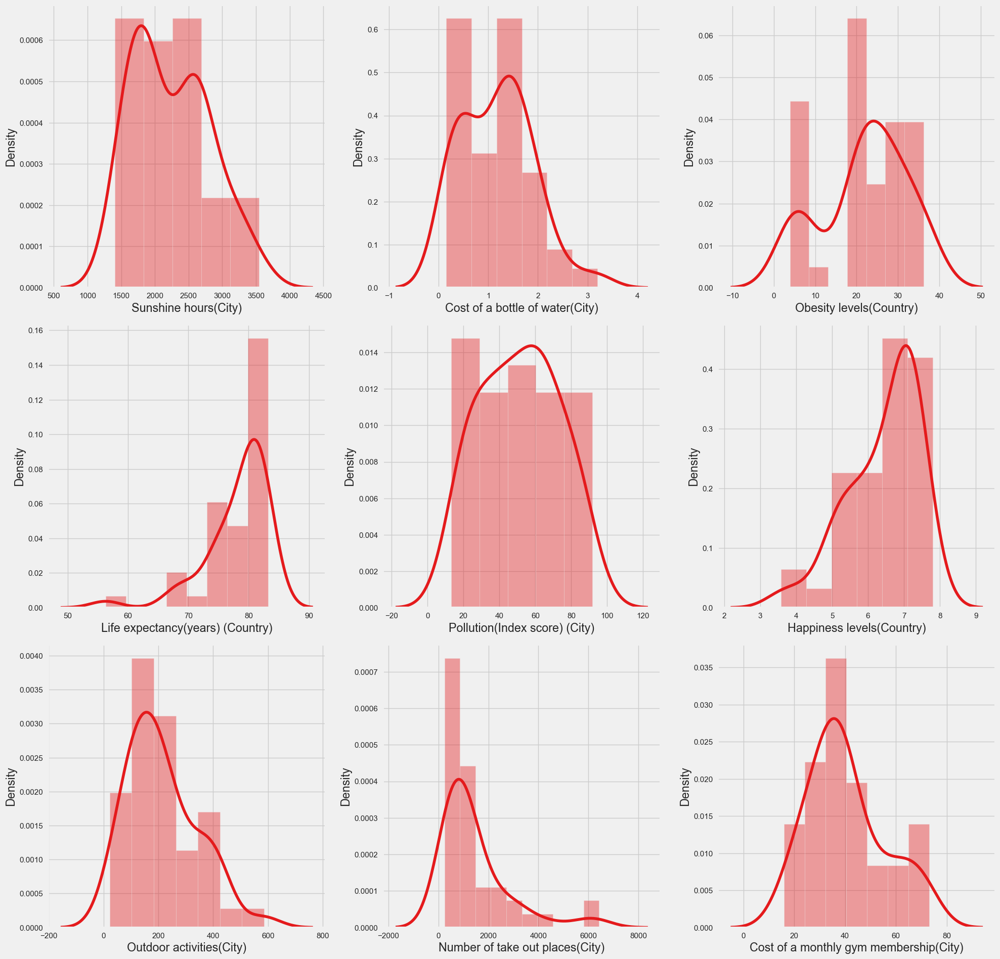

In [16]:
plt.figure(figsize=(20,25))
plotno=1

for column in data1:
    if plotno<+15:
        plt.subplot(4,3,plotno)
        sns.distplot(data1[column])
        plt.xlabel(column)
    plotno+=1
plt.tight_layout()

In [17]:
data.loc[data['Sunshine hours(City)'].isnull()==True,'Sunshine hours(City)']=data['Sunshine hours(City)'].median()
data.loc[data['Pollution(Index score) (City)'].isnull()==True,'Pollution(Index score) (City)']=data['Pollution(Index score) (City)'].median()
data.loc[data['Annual avg. hours worked'].isnull()==True,'Annual avg. hours worked']=data['Annual avg. hours worked'].median()

In [18]:
# Check missing values
data.isnull().sum()

City                                      0
Rank                                      0
Sunshine hours(City)                      0
Cost of a bottle of water(City)           0
Obesity levels(Country)                   0
Life expectancy(years) (Country)          0
Pollution(Index score) (City)             0
Annual avg. hours worked                  0
Happiness levels(Country)                 0
Outdoor activities(City)                  0
Number of take out places(City)           0
Cost of a monthly gym membership(City)    0
dtype: int64

In [19]:
#Changing data types
data.astype({'Sunshine hours(City)':'float64','Cost of a bottle of water(City)':'float64',
             'Obesity levels(Country)':'float64','Annual avg. hours worked':'float64',
             'Pollution(Index score) (City)':'float64',
              'Cost of a monthly gym membership(City)':'float64'}).dtypes

City                                       object
Rank                                        int64
Sunshine hours(City)                      float64
Cost of a bottle of water(City)           float64
Obesity levels(Country)                   float64
Life expectancy(years) (Country)          float64
Pollution(Index score) (City)             float64
Annual avg. hours worked                  float64
Happiness levels(Country)                 float64
Outdoor activities(City)                    int64
Number of take out places(City)             int64
Cost of a monthly gym membership(City)    float64
dtype: object

#### Outlier Handling

In [20]:
box=data[['Sunshine hours(City)','Pollution(Index score) (City)','Annual avg. hours worked',
         'Happiness levels(Country)','Outdoor activities(City)','Number of take out places(City)']]

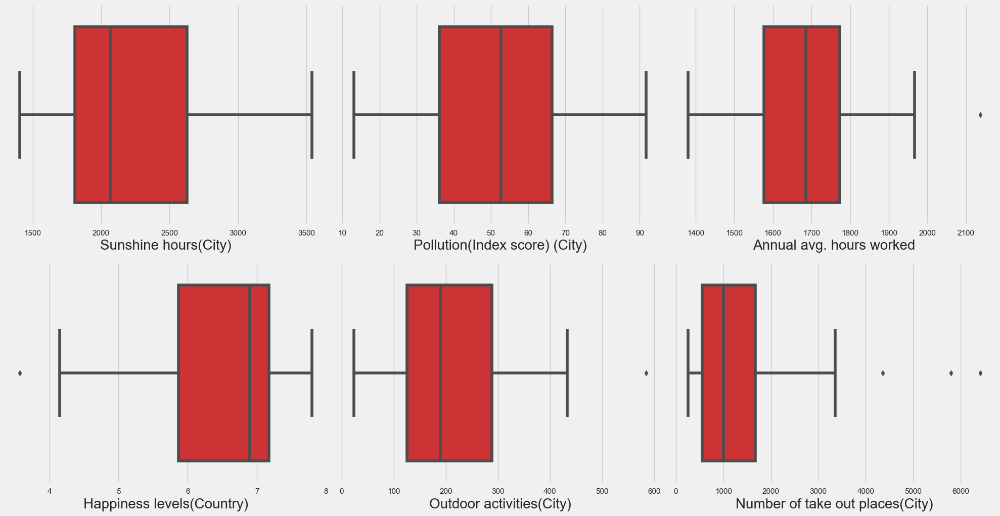

In [21]:
plt.figure(figsize=(20,15))
plotno=1
for column in box:
    if plotno<16:
        plt.subplot(3,3,plotno)
        sns.boxplot(box[column])
        plt.xlabel(column,fontsize=20)
        plotno+=1
plt.tight_layout()

#### Annual avg.hours worked

#### IQR

In [22]:
from scipy import stats

iqr= stats.iqr(data['Annual avg. hours worked'],interpolation='midpoint')
print(iqr)

#min max limit calculation
Q1= data['Annual avg. hours worked'].quantile(0.25) #first quantile
Q3= data['Annual avg. hours worked'].quantile(0.75) #third quantile

#Getting the limits
min_limit=Q1-1.5*iqr
max_limit=Q3-1.5*iqr
print("minimum limit",min_limit)
print("maximum limit",max_limit)

205.5
minimum limit 1268.25
maximum limit 1465.5


In [23]:
# filtering the data
data.loc[data['Annual avg. hours worked']< min_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)


In [24]:
data.loc[data['Annual avg. hours worked']> max_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
1,Sydney,2,2636.0,1.48,29.00,82.1,26.86,1712.0,7.22,406,1103,41.66
2,Vienna,3,1884.0,1.94,20.10,81.0,17.33,1501.0,7.29,132,1008,25.74
5,Helsinki,6,1662.0,1.60,22.20,80.4,13.08,1540.0,7.80,113,309,35.23
6,Fukuoka,7,2769.0,0.78,4.30,83.2,52.64,1644.0,5.87,35,539,55.87
8,Barcelona,9,2591.0,1.19,23.80,82.2,65.19,1686.0,6.40,585,2344,37.80
9,Vancouver,10,1938.0,1.08,29.40,81.7,24.26,1670.0,7.23,218,788,31.04
10,Melbourne,11,2363.0,1.57,29.00,82.1,25.90,1712.0,7.22,243,813,36.89
11,Beijing,12,2671.0,0.26,6.20,75.4,85.43,1686.0,5.12,223,261,38.62
12,Bangkok,13,2624.0,0.22,10.00,74.1,76.64,1686.0,5.99,377,1796,50.03
13,Buenos Aires,14,2525.0,0.57,28.30,75.9,52.64,1686.0,5.97,246,1435,22.45


In [25]:
# impute outlier with median
data.loc[data['Annual avg. hours worked'] > max_limit,'Annual avg. hours worked']=np.median(data['Annual avg. hours worked'])

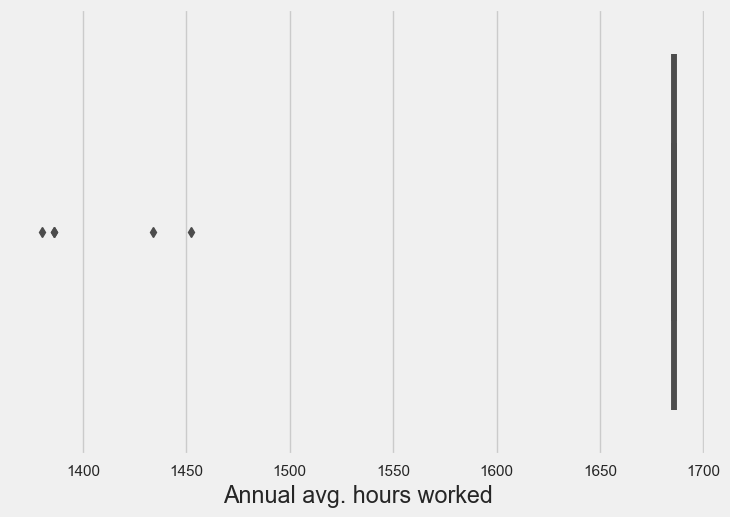

In [26]:
sns.boxplot(data['Annual avg. hours worked'])
plt.show()

#### Happiness levels(Country)

#### IQR

In [27]:
# use iqr beacuse of data are skewed left
iqr = stats.iqr(data['Happiness levels(Country)'],interpolation='midpoint')
print(iqr)

Q1 = data['Happiness levels(Country)'].quantile(0.25) # first quantile
Q3 = data['Happiness levels(Country)'].quantile(0.75) # third quantile
### getting the limits
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

1.3199999999999994
minimum limit 3.890000000000001
maximum limit 9.155


In [28]:
data.loc[data['Happiness levels(Country)'] < min_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
25,Mumbai,26,2584.0,0.15,3.90,67.3,82.84,1686.0,3.57,187,1183,19.54


In [29]:
data.loc[data['Happiness levels(Country)'] > max_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)


In [30]:
data.loc[data['Happiness levels(Country)'] < min_limit,'Happiness levels(Country)']=np.median(data['Happiness levels(Country)'])

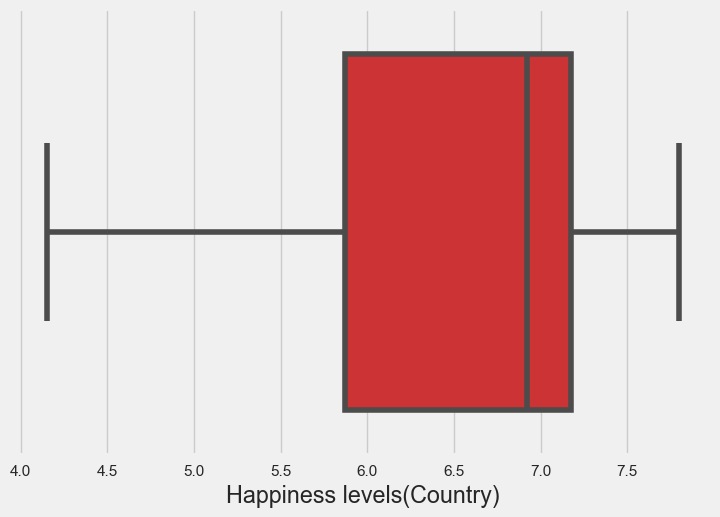

In [31]:
sns.boxplot(data['Happiness levels(Country)']) ## outlier removed
plt.show()

#### Outdoor activities(City)

#### IQR

In [32]:
iqr = stats.iqr(data['Outdoor activities(City)'],interpolation='midpoint')
print(iqr)

Q1 = data['Outdoor activities(City)'].quantile(0.25)  ## first quantile
Q3 = data['Outdoor activities(City)'].quantile(0.75)  ## third quantile
### getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

178.0
minimum limit -141.75
maximum limit 555.25


In [33]:
data.loc[data['Outdoor activities(City)'] < min_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)


In [34]:
data.loc[data['Outdoor activities(City)'] > max_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
8,Barcelona,9,2591.0,1.19,23.80,82.2,65.19,1686.0,6.4,585,2344,37.80


In [35]:
data.loc[data['Outdoor activities(City)'] > max_limit,'Outdoor activities(City)']=np.median(data['Outdoor activities(City)'])

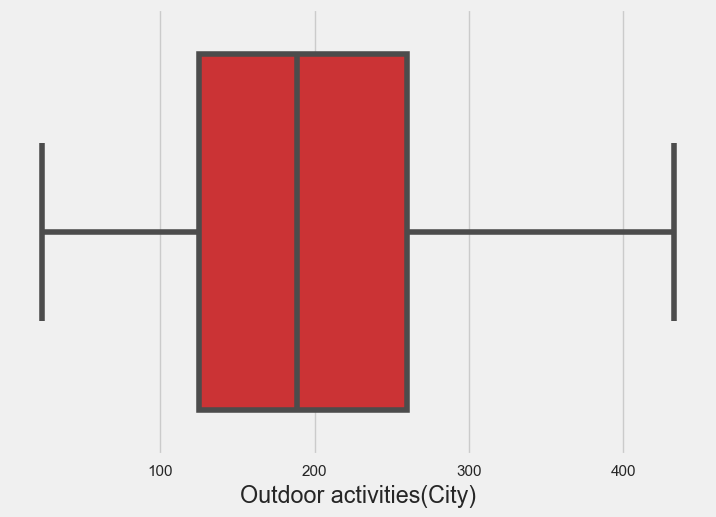

In [36]:
sns.boxplot(data['Outdoor activities(City)'])
plt.show()

#### Number of take out places(City)

#### IQR

In [37]:
iqr = stats.iqr(data['Number of take out places(City)'],interpolation='midpoint')
print(iqr)

Q1 = data['Number of take out places(City)'].quantile(0.25)  ## first quantile
Q3 =data['Number of take out places(City)'].quantile(0.75)   ## third quantile
## getting the maximum and minimum limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

1147.5
minimum limit -1173.25
maximum limit 3395.5


In [38]:
# filtering the data
data.loc[data['Number of take out places(City)'] < min_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)


In [39]:
data.loc[data['Number of take out places(City)'] > max_limit]

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
28,Tokyo,29,1877.0,0.76,4.30,83.2,42.84,1686.0,5.87,387.0,5802,70.82
34,Paris,35,1662.0,1.95,21.60,81.8,65.10,1686.0,6.66,331.0,4363,35.93
37,London,38,1633.0,1.16,27.80,80.4,58.91,1686.0,7.16,433.0,6417,42.71


In [40]:
data.loc[data['Number of take out places(City)'] > max_limit,'Number of take out places(City)']=np.median(data['Number of take out places(City)'])

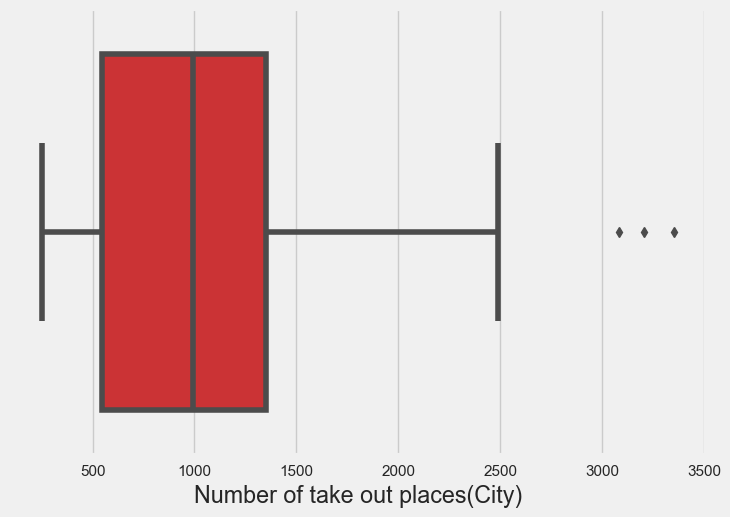

In [41]:
### checking box plot
sns.boxplot(data['Number of take out places(City)'])
plt.show()

#### Scaling the data

In [42]:
from sklearn.preprocessing import MinMaxScaler

scalar = MinMaxScaler()

data[['Sunshine hours(City)','Cost of a bottle of water(City)','Obesity levels(Country)','Life expectancy(years) (Country)',
     'Pollution(Index score) (City)','Annual avg. hours worked','Happiness levels(Country)',
      'Cost of a monthly gym membership(City)','Outdoor activities(City)'
      ,'Number of take out places(City)']] = scalar.fit_transform(data[['Sunshine hours(City)','Cost of a bottle of water(City)',
    'Obesity levels(Country)','Life expectancy(years) (Country)',
     'Pollution(Index score) (City)','Annual avg. hours worked','Happiness levels(Country)',
      'Cost of a monthly gym membership(City)','Outdoor activities(City)','Number of take out places(City)']])

data.head()

,City,Rank,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,Amsterdam,1,0.211979,0.580328,0.510836,0.925651,0.226926,0.176471,0.901370,0.973171,0.257005,0.330119
1,Sydney,2,0.576041,0.436066,0.777090,0.959108,0.175184,1.000000,0.841096,0.934146,0.274718,0.448633
2,Vienna,3,0.224146,0.586885,0.501548,0.918216,0.054030,1.000000,0.860274,0.265854,0.244122,0.169530
3,Stockholm,4,0.194665,0.514754,0.517028,0.947955,0.083270,0.235294,0.876712,0.258537,0.112077,0.372370
4,Copenhagen,5,0.105288,0.668852,0.489164,0.873606,0.103738,0.000000,0.956164,0.319512,0.087923,0.288569


# Feature Selection

In [43]:
#step1:-drop unwanted column
data.drop(['City','Rank'],axis=1,inplace=True)
data.head()

,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,0.211979,0.580328,0.510836,0.925651,0.226926,0.176471,0.901370,0.973171,0.257005,0.330119
1,0.576041,0.436066,0.777090,0.959108,0.175184,1.000000,0.841096,0.934146,0.274718,0.448633
2,0.224146,0.586885,0.501548,0.918216,0.054030,1.000000,0.860274,0.265854,0.244122,0.169530
3,0.194665,0.514754,0.517028,0.947955,0.083270,0.235294,0.876712,0.258537,0.112077,0.372370
4,0.105288,0.668852,0.489164,0.873606,0.103738,0.000000,0.956164,0.319512,0.087923,0.288569


In [44]:
# Check correlation
data2 = data[['Sunshine hours(City)','Cost of a bottle of water(City)','Obesity levels(Country)',
              'Life expectancy(years) (Country)','Pollution(Index score) (City)','Annual avg. hours worked',
              'Happiness levels(Country)','Cost of a monthly gym membership(City)']]

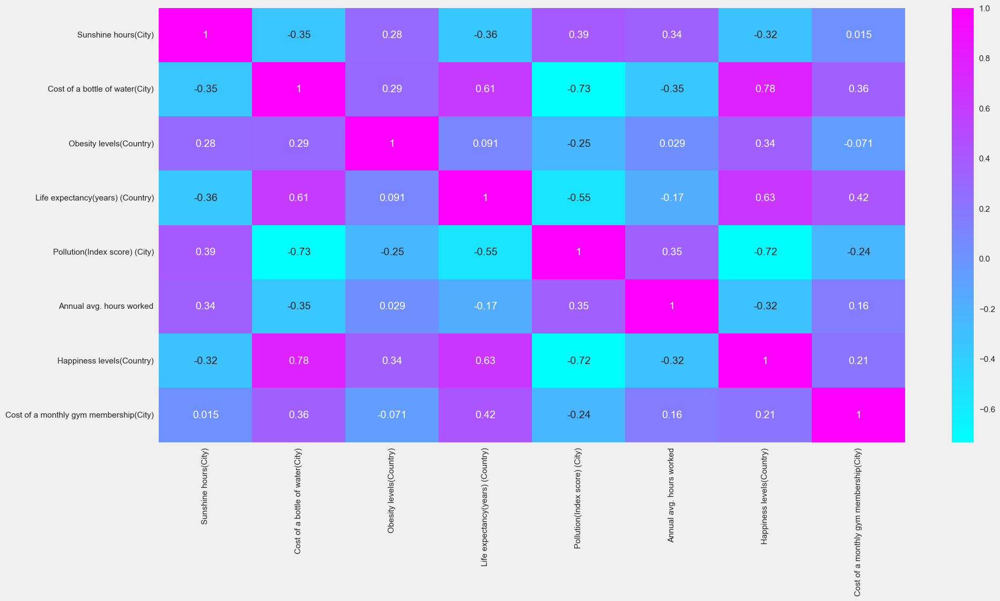

In [45]:
plt.figure(figsize=(20,10))
sns.heatmap(data2.corr(),annot=True,cmap='cool')
plt.show()

#### Observation
* No highly correlated feature in data.

In [46]:
data2.describe()

,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Cost of a monthly gym membership(City)
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000
mean,0.391564,0.335544,0.558050,0.813197,0.484068,0.896613,0.646762,0.426893
std,0.262715,0.235620,0.315655,0.197188,0.274622,0.293931,0.243629,0.263087
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.189401,0.137705,0.482972,0.710037,0.292239,1.000000,0.471233,0.267181
50%,0.309312,0.342623,0.569659,0.895911,0.502924,1.000000,0.758904,0.372721
75%,0.571596,0.475410,0.777090,0.947955,0.677218,1.000000,0.828767,0.545933
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [47]:
# Checking duplicates
data.duplicated().sum()

0

* No duplicate in data.

#### Save preprocessing data

In [48]:
data.to_csv('preprocess.csv')
df=pd.read_csv("preprocess.csv")
df.head()

,Unnamed: 0,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,0,0.211979,0.580328,0.510836,0.925651,0.226926,0.176471,0.901370,0.973171,0.257005,0.330119
1,1,0.576041,0.436066,0.777090,0.959108,0.175184,1.000000,0.841096,0.934146,0.274718,0.448633
2,2,0.224146,0.586885,0.501548,0.918216,0.054030,1.000000,0.860274,0.265854,0.244122,0.169530
3,3,0.194665,0.514754,0.517028,0.947955,0.083270,0.235294,0.876712,0.258537,0.112077,0.372370
4,4,0.105288,0.668852,0.489164,0.873606,0.103738,0.000000,0.956164,0.319512,0.087923,0.288569


### Model Creation

#### K-means(clustering)

In [49]:
# step1: Define data
x=df.iloc[:,1:]
x.head()

,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City)
0,0.211979,0.580328,0.510836,0.925651,0.226926,0.176471,0.901370,0.973171,0.257005,0.330119
1,0.576041,0.436066,0.777090,0.959108,0.175184,1.000000,0.841096,0.934146,0.274718,0.448633
2,0.224146,0.586885,0.501548,0.918216,0.054030,1.000000,0.860274,0.265854,0.244122,0.169530
3,0.194665,0.514754,0.517028,0.947955,0.083270,0.235294,0.876712,0.258537,0.112077,0.372370
4,0.105288,0.668852,0.489164,0.873606,0.103738,0.000000,0.956164,0.319512,0.087923,0.288569


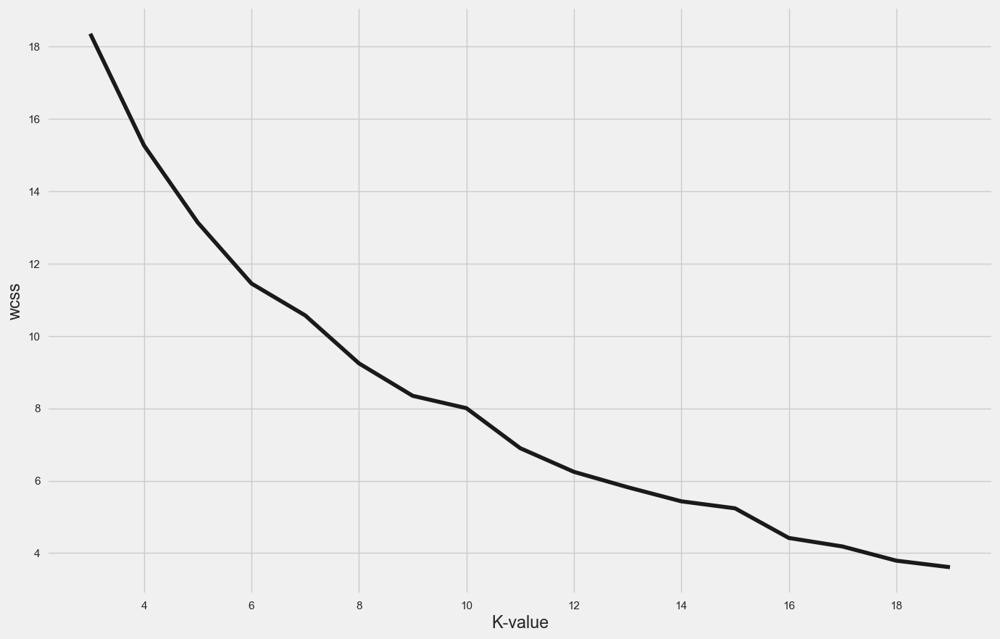

In [50]:
#step2: Get K-value
plt.figure(figsize=(15,10)) #create canvas
from sklearn.cluster import KMeans
wcss = []
for i in range(3,20):
    kmeans = KMeans(n_clusters=i,random_state=42)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)
plt.plot(range(3,20),wcss,c='k')
plt.xlabel('K-value')
plt.ylabel('wcss')
plt.show()

In [51]:
# step3: Initialize the cluster
from sklearn.cluster import KMeans

#initialise model with k as 9
model=KMeans(n_clusters=9,random_state=45)

#fitting the model
model.fit(x)

#Get labels
model.labels_

array([3, 6, 0, 3, 3, 0, 4, 3, 8, 0, 0, 4, 1, 2, 0, 8, 4, 4, 3, 7, 5, 2,
       2, 4, 5, 4, 5, 0, 1, 5, 1, 4, 0, 5, 6, 8, 7, 6, 2, 8, 5, 8, 8, 2])

In [52]:
# print dataset with labels
data['cluster']=pd.DataFrame(model.labels_)
data.head()

,Sunshine hours(City),Cost of a bottle of water(City),Obesity levels(Country),Life expectancy(years) (Country),Pollution(Index score) (City),Annual avg. hours worked,Happiness levels(Country),Outdoor activities(City),Number of take out places(City),Cost of a monthly gym membership(City),cluster
0,0.211979,0.580328,0.510836,0.925651,0.226926,0.176471,0.901370,0.973171,0.257005,0.330119,3
1,0.576041,0.436066,0.777090,0.959108,0.175184,1.000000,0.841096,0.934146,0.274718,0.448633,6
2,0.224146,0.586885,0.501548,0.918216,0.054030,1.000000,0.860274,0.265854,0.244122,0.169530,0
3,0.194665,0.514754,0.517028,0.947955,0.083270,0.235294,0.876712,0.258537,0.112077,0.372370,3
4,0.105288,0.668852,0.489164,0.873606,0.103738,0.000000,0.956164,0.319512,0.087923,0.288569,3


In [53]:
# Initilize centroid
model.cluster_centers_

array([[0.20569557, 0.45620609, 0.66430783, 0.92246415, 0.23533471,
        1.        , 0.8481409 , 0.32508711, 0.20570508, 0.27985374],
       [0.3309936 , 0.13989071, 0.09081527, 0.7905824 , 0.6259005 ,
        1.        , 0.44931507, 0.7902439 , 0.35437466, 0.76314867],
       [0.64941507, 0.07672131, 0.80557276, 0.53903346, 0.7451818 ,
        1.        , 0.31616438, 0.61414634, 0.20444444, 0.17037167],
       [0.14712213, 0.56262295, 0.53126935, 0.91078067, 0.21253496,
        0.09019608, 0.86684932, 0.42292683, 0.20605475, 0.31384993],
       [0.42910622, 0.08430913, 0.04909332, 0.7031333 , 0.72333006,
        1.        , 0.40039139, 0.27317073, 0.11585001, 0.38556902],
       [0.69154578, 0.43114754, 0.94788442, 0.85563817, 0.40632681,
        1.        , 0.77260274, 0.32845528, 0.21696189, 0.62067555],
       [0.26766495, 0.45245902, 0.68833849, 0.93432466, 0.47304856,
        1.        , 0.78447489, 0.89512195, 0.25217391, 0.42128331],
       [0.19232569, 0.90491803, 0.4829721

# Model Evaluation

In [54]:
# Model evaluation matrices
label=model.labels_  ## Create new variable & assign to labels
label

from sklearn.metrics import silhouette_score
score=silhouette_score(x,label)
score  #range of silhouette score -1 to +1

0.26732961880964834